In [1]:
""" !rm -rf /content/drive # remove the directory and its contents
!mkdir /content/drive # create a new empty directory
from google.colab import drive
drive.mount('/content/drive') """

" !rm -rf /content/drive # remove the directory and its contents\n!mkdir /content/drive # create a new empty directory\nfrom google.colab import drive\ndrive.mount('/content/drive') "

In [2]:
import os
import shutil
from sklearn.model_selection import train_test_split # To split the data into train and test
import cv2
import random
from concurrent.futures import ThreadPoolExecutor
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import numpy as np
import glob

## 1. Data Preparation

The given dataset is provided in the following format:

```sh
Riped, Unriped and Damaged Tomato Dataset/
── Images/
   ├── riped_tomato_1.jpeg
   ├── uriped_tomato_10.jpeg
   ├── reject_tomato_11.jpeg
   ├── riped_tomato_12.jpeg
   └── ...
```



In [3]:
images_dir = 'dataset_2\\images'
labels_dir = 'dataset_2\\labels'

print(f"Images Dir: {images_dir}, Labels Dir: {labels_dir}")

Images Dir: dataset_2\images, Labels Dir: dataset_2\labels


In [4]:
def load_data(images_dir, labels_dir):
    images = []
    annotations = []

    for filename in os.listdir(images_dir):
        if filename.endswith('.jpg'):
            image_path = os.path.join(images_dir, filename)
            annotation_path = os.path.join(labels_dir, filename.replace('.jpg', '.txt'))

            if os.path.exists(annotation_path):
                images.append(image_path)
                annotations.append(annotation_path)

    return images, annotations

images, annotations = load_data(images_dir, labels_dir)

Number of images loaded: 1918
Sample image paths and labels: [('dataset_2\\images\\healthy-10-_jpg.rf.ffaba1de5ca8df87a77f1d65b7313807.jpg', 'healthy'), ('dataset_2\\images\\healthy-1003-_jpg.rf.0bde2c7a0e77d79efaab7d2abb129dc9.jpg', 'healthy'), ('dataset_2\\images\\healthy-1007-_jpg.rf.33a18a96d084b14e4d156f740e9eb0c6.jpg', 'healthy'), ('dataset_2\\images\\healthy-1008-_jpg.rf.aac8b1fb27058b647f68c84ea514c80c.jpg', 'healthy'), ('dataset_2\\images\\healthy-101-_jpg.rf.d3b76946725599996306638ee12c783b.jpg', 'healthy')]


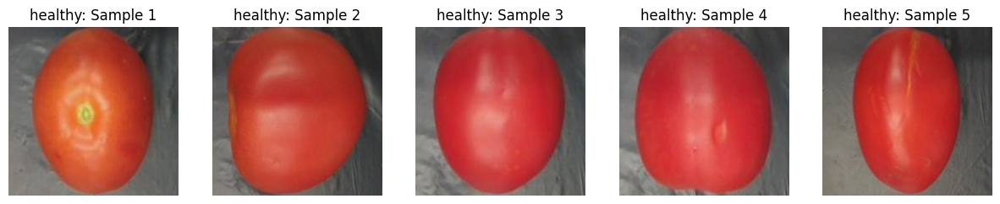

In [5]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Function to load images and infer labels from filenames
def load_data(images_dir):
    images = []
    labels = []

    # Loop through the directory and gather all image file paths
    for filename in os.listdir(images_dir):
        if filename.endswith('.jpeg') or filename.endswith('.jpg') or filename.endswith('.png'):
            image_path = os.path.join(images_dir, filename)
            images.append(image_path)  # Append the image path

            # Infer the label from the filename (assume 'healthy', 'unripe', 'reject' in the filename)
            if 'healthy' in filename.lower():
                labels.append('healthy')
            elif 'unripe' in filename.lower():
                labels.append('unripe')
            elif 'reject' in filename.lower():
                labels.append('reject')
            else:
                labels.append('unknown')  # Label as 'unknown' if none of the expected keywords are found

    return images, labels

# Function to visualize a few image samples
def visualize_samples(images, labels, num_samples=5):
    # Ensure we don't try to display more samples than we have
    num_samples = min(num_samples, len(images))

    if num_samples == 0:
        print("No images found!")
        return

    fig, axs = plt.subplots(1, num_samples, figsize=(15, 5))

    for i in range(num_samples):
        image = Image.open(images[i])
        axs[i].imshow(image)
        axs[i].axis('off')
        axs[i].set_title(f'{labels[i]}: Sample {i+1}')

    plt.show()

# Define the base directory for the dataset (where all images are stored)
images_dir = 'dataset_2\\images'

# Load the data (images and labels)
images, labels = load_data(images_dir)

# Debugging: Print the number of images and some sample paths with labels
print(f"Number of images loaded: {len(images)}")
print("Sample image paths and labels:", list(zip(images[:5], labels[:5])))

# Visualize some image samples if images are loaded
if len(images) > 0:
    visualize_samples(images, labels, num_samples=5)
else:
    print("No images found in the specified directory.")


To visualizes a random sample of images. Let's create a `visualize_samples` function.

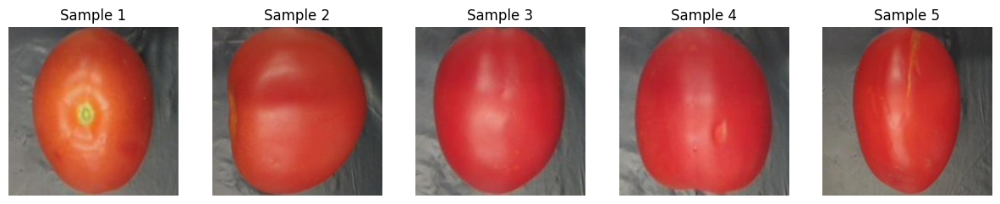

In [6]:
def visualize_samples(images, num_samples=5):
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 5))

    for i in range(num_samples):
        image = Image.open(images[i])
        axs[i].imshow(image)
        axs[i].axis('off')
        axs[i].set_title(f'Sample {i+1}')
    plt.show()

visualize_samples(images)

Let's calculate and visualize the average height and width of the images in the dataset.

In [7]:
def calculate_average_size(images_dir):
    total_width = 0
    total_height = 0
    total_images = 0

    for filename in os.listdir(images_dir):
        if filename.endswith('.jpg') or filename.endswith('.jpeg'):  # assuming images are in .jpeg format
            image_path = os.path.join(images_dir, filename)
            image = Image.open(image_path)
            width, height = image.size
            total_width += width
            total_height += height
            total_images += 1

    if total_images > 0:
        average_width = total_width / total_images
        average_height = total_height / total_images
        return average_width, average_height
    else:
        return None

In [8]:
def plot_average_size(average_width, average_height):
    categories = ['Average Width', 'Average Height']
    values = [average_width, average_height]

    plt.figure(figsize=(6, 4))
    plt.bar(categories, values, color=['skyblue', 'lightgreen'])
    plt.xlabel('Categories')
    plt.ylabel('Pixels')
    plt.title('Average Image Dimensions')
    plt.ylim(0, max(values) * 1.1)
    plt.grid(axis='y')
    plt.show()

Average Image Width: 297.48 pixels
Average Image Height: 297.48 pixels


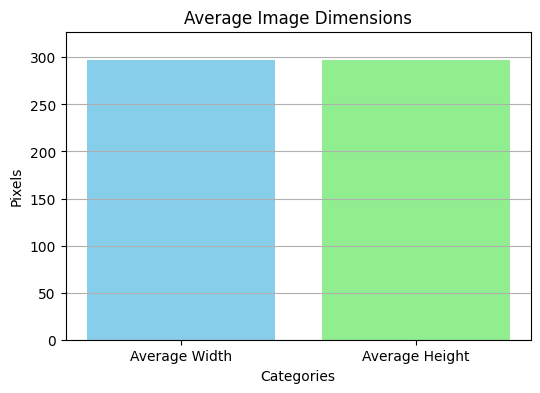

In [9]:
average_width, average_height = calculate_average_size(images_dir)

if average_width and average_height:
    print(f"Average Image Width: {average_width:.2f} pixels")
    print(f"Average Image Height: {average_height:.2f} pixels")

    # Plot average size
    plot_average_size(average_width, average_height)
else:
    print("No images found or unable to calculate average size.")

We are also going to plot the distribution of classes ('ripe', 'unripe' and 'reject') so, let's create a seperate function for this.

healthy: 797
unripe: 452
reject: 669


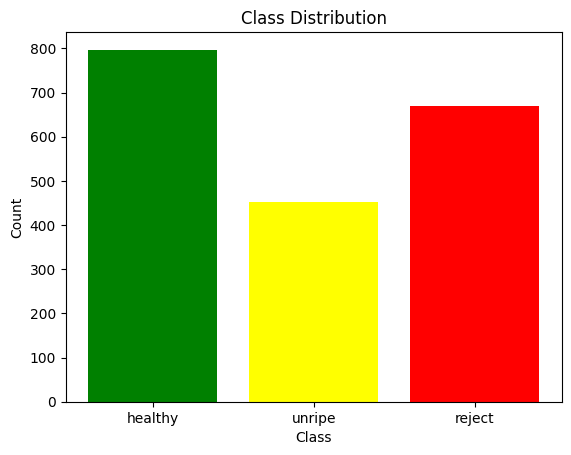

In [10]:
import os
import matplotlib.pyplot as plt

def plot_class_distribution(images_dir):
    # Initialize class counts
    classes = {'healthy': 0, 'unripe': 0, 'reject': 0}

    # Iterate over all files in the directory
    for filename in os.listdir(images_dir):
        if filename.endswith(('.jpg', '.jpeg', '.png')):  # Check for image files
            # Categorize based on file name containing class labels
            if 'healthy' in filename.lower():
                classes['healthy'] += 1
            elif 'unripe' in filename.lower():
                classes['unripe'] += 1
            elif 'reject' in filename.lower():
                classes['reject'] += 1

    # Print the class counts
    for cls, count in classes.items():
        print(f"{cls}: {count}")

    # Plotting the class distribution
    plt.bar(classes.keys(), classes.values(), color=['green', 'yellow', 'red'])
    plt.title('Class Distribution')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.show()

# Example usage
images_dir = 'dataset_2\\images'  # Update with the correct path
plot_class_distribution(images_dir)


Let's explore the RGB distributions of our datasets. Generally, the ripe tomatoes will have higher intensity in the red channel, whereas unripe tomatoes might have higher intensity in the green channel.

Number of healthy images: 797
Number of unripe images: 452
Number of reject images: 669


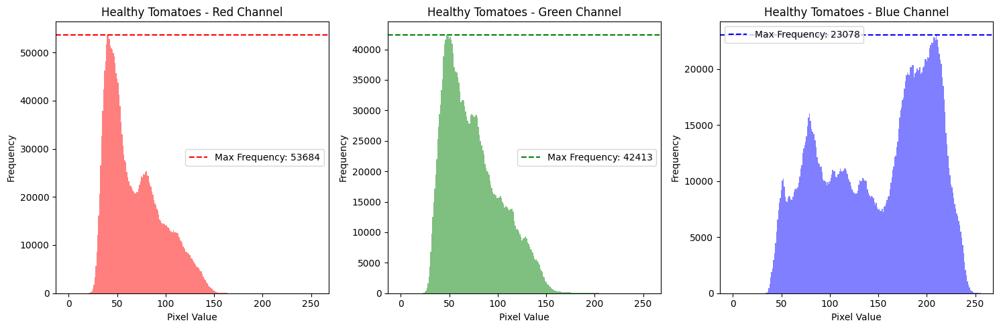

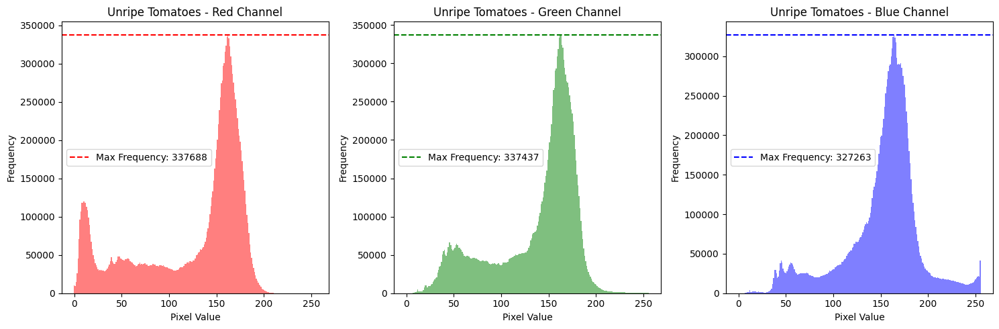

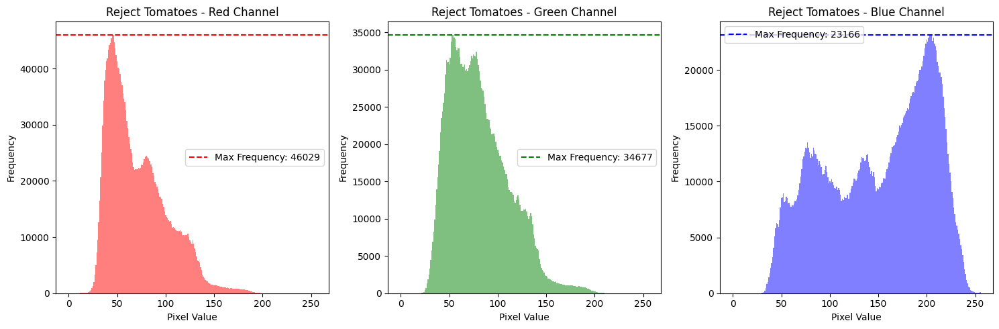

In [11]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from concurrent.futures import ThreadPoolExecutor

def read_image(img_path):
    """Read an image using OpenCV."""
    img = cv2.imread(img_path)
    if img is not None:
        return img
    return np.array([])

def process_images_in_batches(images, max_images=50, batch_size=10):
    """Process images in batches to reduce memory usage."""
    r_values, g_values, b_values = [], [], []

    # Limit the number of images to max_images
    images = images[:max_images]

    for i in range(0, len(images), batch_size):
        batch = images[i:i + batch_size]
        with ThreadPoolExecutor() as executor:
            img_list = list(executor.map(read_image, batch))

        for img in img_list:
            if img.size > 0:
                r_values.extend(img[:, :, 0].flatten())
                g_values.extend(img[:, :, 1].flatten())
                b_values.extend(img[:, :, 2].flatten())

    return r_values, g_values, b_values

def plot_rgb_distribution(images, category_name, max_images=50, batch_size=10):
    """Plot RGB distribution for the given images."""
    r_values, g_values, b_values = process_images_in_batches(images, max_images, batch_size)

    plt.figure(figsize=(15, 5))

    # Red Channel
    plt.subplot(1, 3, 1)
    r_hist, r_bins = np.histogram(r_values, bins=256, range=(0, 256))
    plt.bar(r_bins[:-1], r_hist, width=1, color='red', alpha=0.5)
    max_r_freq = r_hist.max()
    plt.axhline(max_r_freq, color='red', linestyle='--', label=f'Max Frequency: {max_r_freq}')
    plt.title(f'{category_name} - Red Channel')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.legend()

    # Green Channel
    plt.subplot(1, 3, 2)
    g_hist, g_bins = np.histogram(g_values, bins=256, range=(0, 256))
    plt.bar(g_bins[:-1], g_hist, width=1, color='green', alpha=0.5)
    max_g_freq = g_hist.max()
    plt.axhline(max_g_freq, color='green', linestyle='--', label=f'Max Frequency: {max_g_freq}')
    plt.title(f'{category_name} - Green Channel')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.legend()

    # Blue Channel
    plt.subplot(1, 3, 3)
    b_hist, b_bins = np.histogram(b_values, bins=256, range=(0, 256))
    plt.bar(b_bins[:-1], b_hist, width=1, color='blue', alpha=0.5)
    max_b_freq = b_hist.max()
    plt.axhline(max_b_freq, color='blue', linestyle='--', label=f'Max Frequency: {max_b_freq}')
    plt.title(f'{category_name} - Blue Channel')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Set the images directory path
images_dir = 'dataset_2/images'  # Update this with the correct path

# Get a list of all image files in the directory
images = [os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Separate images based on their filenames
healthy_images = []
unripe_images = []
reject_images = []

for img_path in images:
    filename = os.path.basename(img_path).lower()
    if 'healthy' in filename:
        healthy_images.append(img_path)
    elif 'unripe' in filename:
        unripe_images.append(img_path)
    elif 'reject' in filename:
        reject_images.append(img_path)

# Debugging: Print the number of images in each category
print(f"Number of healthy images: {len(healthy_images)}")
print(f"Number of unripe images: {len(unripe_images)}")
print(f"Number of reject images: {len(reject_images)}")

# Plot RGB distribution for healthy tomatoes
plot_rgb_distribution(healthy_images, 'Healthy Tomatoes')

# Plot RGB distribution for unripe tomatoes
plot_rgb_distribution(unripe_images, 'Unripe Tomatoes')

# Plot RGB distribution for reject tomatoes
plot_rgb_distribution(reject_images, 'Reject Tomatoes')


From above, we can see that the **RED** color distribution is higher for ripe tomatoes whereas **Green** for unripe ones, indicating that ripe tomatoes have stronger presenence of red color in their images and green color for unripe ones. Lets apply various edge detection technique and see which better captures the tomato features.

* **Adaptive Thresholding**: Enhances contrast to highlight edges.
* **Laplacian Detection**: Detects rapid intensity changes.
* **Canny Detection**: Identifies detailed edges through gradient analysis.
* **Sobel Detection**: Finds edges using gradient in x and y directions.

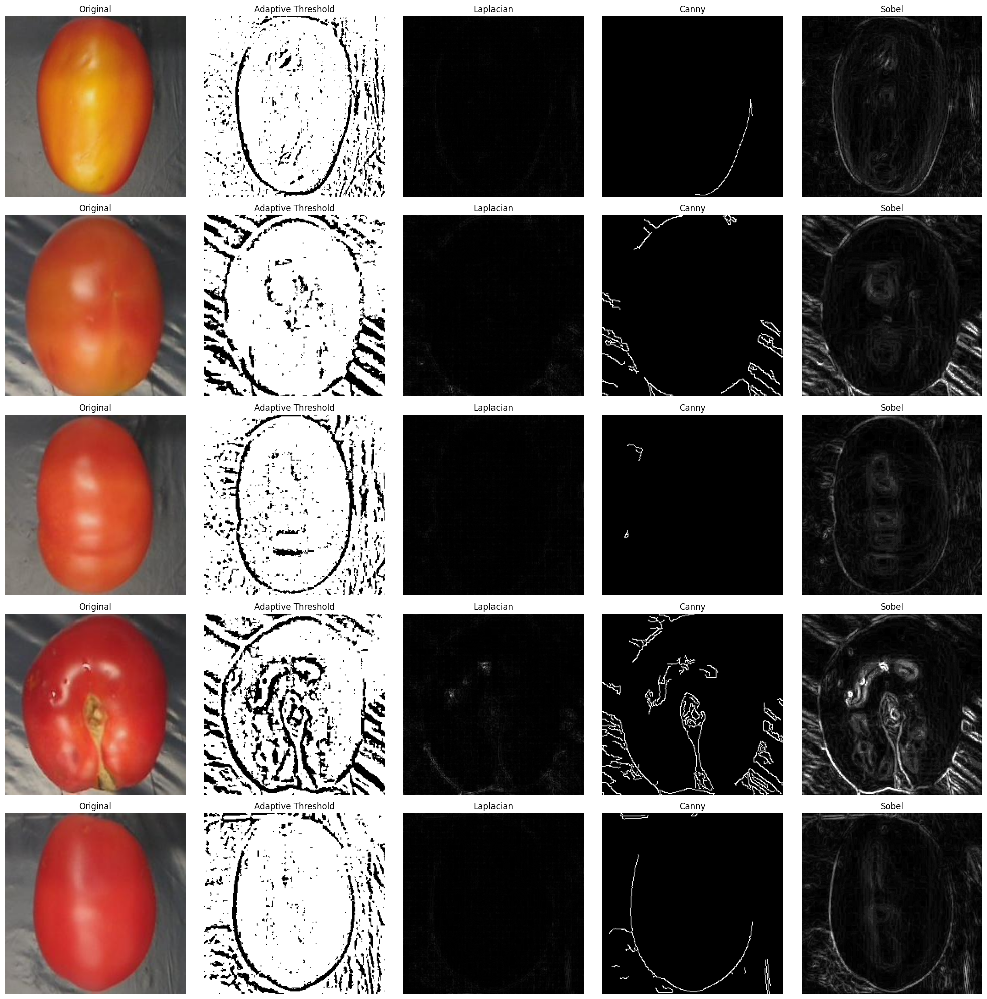

In [12]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import random
from glob import glob

def calculate_edge_density(edges):
    """Calculate the density of edges in the image."""
    return np.sum(edges) / edges.size

def display_random_images_with_edges(basefolder, num_images=5):
    """Display random images with various edge detection techniques."""
    # Get list of image files
    image_files = glob(os.path.join(basefolder, "*.jpg")) + glob(os.path.join(basefolder, "*.jpeg")) + glob(os.path.join(basefolder, "*.png"))

    # Check if there are enough images to display
    if len(image_files) < num_images:
        print(f"Not enough images in {basefolder} to display {num_images}.")
        return

    # Randomly select images
    selected_images = random.sample(image_files, num_images)

    # Create subplots to display the images
    fig, axes = plt.subplots(num_images, 5, figsize=(20, 4 * num_images))

    for idx, image_file in enumerate(selected_images):
        # Read and preprocess the image
        img = cv2.imread(image_file)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Apply various edge detection techniques
        # Adaptive Thresholding
        adaptive_thresh = cv2.adaptiveThreshold(gray_img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 3)

        # Laplacian Edge Detection
        lap = cv2.Laplacian(gray_img, cv2.CV_64F)
        lap = np.uint8(np.absolute(lap))
        lap_rgb = cv2.cvtColor(lap, cv2.COLOR_GRAY2RGB)

        # Canny Edge Detection
        mean_intensity = np.mean(gray_img)
        std_intensity = np.std(gray_img)
        lower_threshold = int(max(0, mean_intensity - 2 * std_intensity))
        upper_threshold = int(min(255, mean_intensity + 2 * std_intensity))
        edges = cv2.Canny(gray_img, lower_threshold, upper_threshold)

        # Sobel Edge Detection
        sobelx = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0)
        sobely = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1)
        combined_sobel = cv2.bitwise_or(cv2.convertScaleAbs(sobelx), cv2.convertScaleAbs(sobely))
        combined_sobel_rgb = cv2.cvtColor(combined_sobel, cv2.COLOR_GRAY2RGB)

        # Display Original Image
        axes[idx, 0].imshow(img_rgb)
        axes[idx, 0].set_title('Original')
        axes[idx, 0].axis('off')

        # Display Adaptive Thresholded Image
        axes[idx, 1].imshow(adaptive_thresh, cmap='gray')
        axes[idx, 1].set_title('Adaptive Threshold')
        axes[idx, 1].axis('off')

        # Display Laplacian Edge Detection Image
        axes[idx, 2].imshow(lap_rgb)
        axes[idx, 2].set_title('Laplacian')
        axes[idx, 2].axis('off')

        # Display Canny Edge Detection Image
        axes[idx, 3].imshow(edges, cmap='gray')
        axes[idx, 3].set_title('Canny')
        axes[idx, 3].axis('off')

        # Display Sobel Edge Detection Image
        axes[idx, 4].imshow(combined_sobel_rgb)
        axes[idx, 4].set_title('Sobel')
        axes[idx, 4].axis('off')

    # Adjust layout and show plot
    plt.tight_layout()
    plt.show()

# Set the images directory path
images_dir = 'dataset_2/images'  # Update this with the correct path

# Call the function to display random images with edges
display_random_images_with_edges(images_dir, num_images=5)


Let's compare the edge density of above edge detection. For this, we will plot the frequency vs edge density of the above applied techniques.

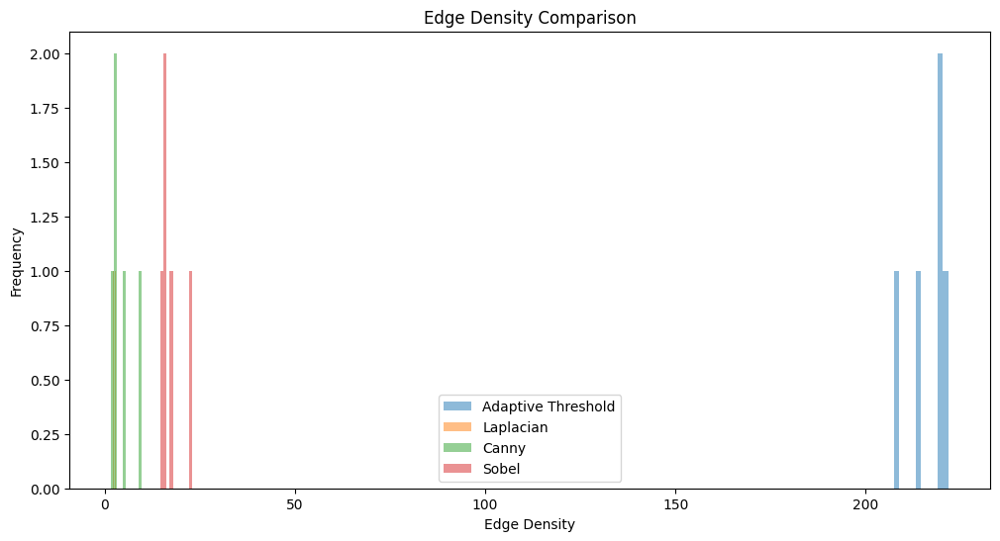

In [13]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import random
from glob import glob

def calculate_edge_density(edges):
    """Calculate the density of edges in the image."""
    return np.sum(edges) / edges.size

def display_edge_density(basefolder, num_images=5):
    """Display the edge density of random images using various edge detection techniques."""
    # Get list of image files in various formats
    image_files = glob(os.path.join(basefolder, "*.jpeg")) + \
                  glob(os.path.join(basefolder, "*.jpg")) + \
                  glob(os.path.join(basefolder, "*.png"))

    # Check if there are enough images to display
    if len(image_files) < num_images:
        print(f"Not enough images in {basefolder} to display {num_images}.")
        return

    # Randomly select images
    selected_images = random.sample(image_files, num_images)
    densities = {'Adaptive Threshold': [], 'Laplacian': [], 'Canny': [], 'Sobel': []}

    for img_file in selected_images:
        # No need to join the folder again; img_file already has the full path
        img = cv2.imread(img_file)
        
        # Check if the image was loaded correctly
        if img is None:
            print(f"Failed to load image: {img_file}")
            continue

        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Adaptive Thresholding
        adaptive_thresh = cv2.adaptiveThreshold(gray_img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 3)
        densities['Adaptive Threshold'].append(calculate_edge_density(adaptive_thresh))

        # Laplacian Edge Detection
        lap = cv2.Laplacian(gray_img, cv2.CV_64F)
        lap = np.uint8(np.absolute(lap))
        densities['Laplacian'].append(calculate_edge_density(lap))

        # Canny Edge Detection
        mean_intensity = np.mean(gray_img)
        std_intensity = np.std(gray_img)
        lower_threshold = int(max(0, mean_intensity - 2 * std_intensity))
        upper_threshold = int(min(255, mean_intensity + 2 * std_intensity))
        edges = cv2.Canny(gray_img, lower_threshold, upper_threshold)
        densities['Canny'].append(calculate_edge_density(edges))

        # Sobel Edge Detection
        sobelx = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0)
        sobely = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1)
        combined_sobel = cv2.bitwise_or(cv2.convertScaleAbs(sobelx), cv2.convertScaleAbs(sobely))
        densities['Sobel'].append(calculate_edge_density(combined_sobel))

    # Plot the average edge densities for each method
    plt.figure(figsize=(12, 6))
    for method, density_values in densities.items():
        plt.hist(density_values, bins=10, alpha=0.5, label=method)

    plt.title('Edge Density Comparison')
    plt.xlabel('Edge Density')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

# Set the images directory path
images_dir = r'dataset_2\images'  # Update this with the correct path

# Call the function to display edge density
display_edge_density(images_dir, num_images=5)


From the above, we can see the frequency and edge density of each technique. For detecting finer details or stronger edges, higher frequencies are better.



To draw the bounding boxes on an image based on annotations, we will be using draw_bounding_boxes function.

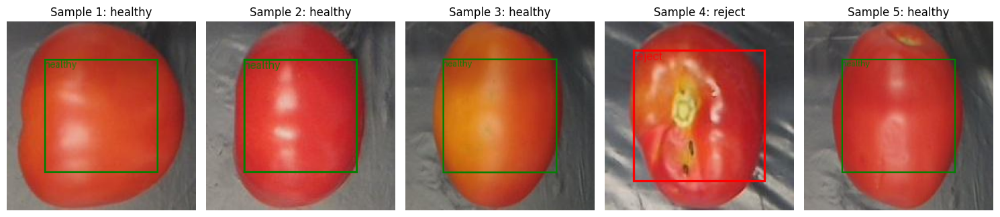

In [14]:
import os
import random
from glob import glob
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

def draw_bounding_boxes(image_path, label):
    """Draw bounding boxes on an image based on the class label."""
    # Load the image
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)

    # Define colors for each class
    colors = {
        'healthy': 'green',
        'unripe': 'yellow',
        'reject': 'red'
    }

    # Get image dimensions
    img_width, img_height = image.size

    # Simulate bounding box coordinates based on the label
    if label == 'healthy':
        # Simulated box for healthy
        x_min = int(img_width * 0.2)
        y_min = int(img_height * 0.2)
        x_max = int(img_width * 0.8)
        y_max = int(img_height * 0.8)
    elif label == 'unripe':
        # Simulated box for unripe
        x_min = int(img_width * 0.1)
        y_min = int(img_height * 0.1)
        x_max = int(img_width * 0.9)
        y_max = int(img_height * 0.9)
    elif label == 'reject':
        # Simulated box for reject
        x_min = int(img_width * 0.15)
        y_min = int(img_height * 0.15)
        x_max = int(img_width * 0.85)
        y_max = int(img_height * 0.85)

    # Draw the bounding box
    draw.rectangle([x_min, y_min, x_max, y_max], outline=colors[label], width=2)

    # Add class label text
    draw.text((x_min, y_min), label, fill=colors[label])

    return image

def display_images_with_bboxes(images_dir, num_samples=5):
    """Display images with drawn bounding boxes based on filename labels."""
    image_files = glob(os.path.join(images_dir, "*.jpg"))  # Assuming images are in .jpg format

    # Check if enough images are available
    if len(image_files) < num_samples:
        print(f"Not enough images in {images_dir} to display {num_samples}.")
        return

    plt.figure(figsize=(15, 6))
    for i, img_file in enumerate(random.sample(image_files, num_samples)):
        # Determine the class label from the filename
        filename = os.path.basename(img_file)
        if 'healthy' in filename:
            label = 'healthy'
        elif 'unripe' in filename:
            label = 'unripe'
        elif 'reject' in filename:
            label = 'reject'
        else:
            continue  # Skip images that don't have valid labels

        image_with_bboxes = draw_bounding_boxes(img_file, label)
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(image_with_bboxes)
        plt.axis('off')
        plt.title(f'Sample {i + 1}: {label}')

    plt.tight_layout()
    plt.show()

# Use the function to display images with bounding boxes
images_dir = "dataset_2/images"  # Update this path to your images directory
display_images_with_bboxes(images_dir, num_samples=5)


In [15]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Define working directories for train/test subdirectories
working_dir = 'dataset_2\\images'
working_dir1 = "dataset_2\\labels"  # Replace this with your actual path

train_images_dir = os.path.join(working_dir, "train", "images")
train_labels_dir = os.path.join(working_dir, "train", 'labels')
test_images_dir = os.path.join(working_dir,"test", 'images')
test_labels_dir = os.path.join(working_dir, "test", 'labels')

# Print the directory structure
print(f"Train Images Dir: {train_images_dir}")
print(f"Test Images Dir: {test_images_dir}")
print(f"Train Labels Dir: {train_labels_dir}")
print(f"Test Labels Dir: {test_labels_dir}")

# Create train/test directories if they don't exist
os.makedirs(train_images_dir, exist_ok=True)
os.makedirs(train_labels_dir, exist_ok=True)
os.makedirs(test_images_dir, exist_ok=True)
os.makedirs(test_labels_dir, exist_ok=True)

# Set the source directory for images and labels
images_dir = "dataset_2\\images"  # Replace with the actual directory containing your images
labels_dir = "dataset_2\\labels"  # Replace with the actual directory containing your labels

# Get list of images and labels (assuming your images have .jpeg extension)
images = [f for f in os.listdir(images_dir) if f.endswith('.jpg') or f.endswith('.jpeg')]
labels = [f.replace('.jpg', '.txt') for f in images]

print(f"Images Length: {len(images)}")
print(f"Labels Length: {len(labels)}")

# Check if we have enough images to split
if len(images) < 5:
    print("Not enough images to create training and testing sets. Please add more images.")
else:
    # Split into training and testing sets (using 85% for training, 15% for testing)
    train_images, test_images = train_test_split(images, test_size=0.15, random_state=34)
    train_labels = [f.replace('.jpg', '.txt') for f in train_images]
    test_labels = [f.replace('.jpg', '.txt') for f in test_images]

    print(f"Training set: {len(train_images)} images, {len(train_labels)} labels")
    print(f"Testing set: {len(test_images)} images, {len(test_labels)} labels")

    # Function to copy files to their respective train/test directories
    def copy_files(file_list, src_path, dst_path):
        for file in file_list:
            shutil.copy(os.path.join(src_path, file), os.path.join(dst_path, file))

    # Copy image and label files to the respective directories
    copy_files(train_images, images_dir, train_images_dir)
    copy_files(train_labels, labels_dir, train_labels_dir)
    copy_files(test_images, images_dir, test_images_dir)
    copy_files(test_labels, labels_dir, test_labels_dir)

    print("Files copied to train and test directories successfully.")


Train Images Dir: dataset_2\images\train\images
Test Images Dir: dataset_2\images\test\images
Train Labels Dir: dataset_2\images\train\labels
Test Labels Dir: dataset_2\images\test\labels
Images Length: 1918
Labels Length: 1918
Training set: 1630 images, 1630 labels
Testing set: 288 images, 288 labels
Files copied to train and test directories successfully.


In [16]:
import os
import numpy as np
from PIL import Image
from concurrent.futures import ThreadPoolExecutor

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box1, box2):
    xi1 = max(box1[0], box2[0])
    yi1 = max(box1[1], box2[1])
    xi2 = min(box1[2], box2[2])
    yi2 = min(box1[3], box2[3])

    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    union_area = box1_area + box2_area - inter_area
    return inter_area / union_area if union_area != 0 else 0

# Placeholder function to generate bounding boxes based on image size and class label
def generate_bounding_box(image, class_label):
    img_width, img_height = image.size
    if class_label == 'healthy':
        return [0.2 * img_width, 0.2 * img_height, 0.6 * img_width, 0.6 * img_height]  # Hypothetical bounding box for healthy
    elif class_label == 'unripe':
        return [0.1 * img_width, 0.1 * img_height, 0.5 * img_width, 0.5 * img_height]  # Hypothetical bounding box for unripe
    elif class_label == 'reject':
        return [0.3 * img_width, 0.3 * img_height, 0.7 * img_width, 0.7 * img_height]  # Hypothetical bounding box for reject
    else:
        return [0, 0, img_width, img_height]  # Fallback if class is not recognized

# Function to load images and generate bounding boxes
def load_and_generate_bboxes(image_file):
    image_path = os.path.join(images_dir, image_file)
    image = Image.open(image_path)
    
    # Determine class label from filename
    if 'healthy' in image_file:
        class_label = 'healthy'
    elif 'unripe' in image_file:
        class_label = 'unripe'
    elif 'reject' in image_file:
        class_label = 'reject'
    else:
        return None, None

    # Generate bounding box for the image
    bbox = generate_bounding_box(image, class_label)
    return image_file, bbox

# Path to images directory
images_dir = "dataset_2/images"   # Replace with your actual path

# List of images
image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]

# Pre-load images and their bounding boxes using multiprocessing
with ThreadPoolExecutor() as executor:
    results = list(executor.map(load_and_generate_bboxes, image_files))

# Filter out invalid results (e.g., files without a proper label)
results = [res for res in results if res[0] is not None]

# IoU calculation
ious = []

for i in range(len(results)):
    file1, box1 = results[i]

    # Compare with a second image, avoiding redundant comparisons
    for j in range(i + 1, len(results)):
        file2, box2 = results[j]

        # Calculate IoU for the two bounding boxes
        iou = calculate_iou(box1, box2)
        ious.append(iou)

# Compute the average IoU
if ious:
    average_iou = np.mean(ious)
    print("Average IoU:", average_iou)
else:
    print("No valid IoU calculations were made.")


Average IoU: 0.38174079893038626


## 2. Model Creation
For our project on detecting ripe, unripe and damaged tomatoes, let's install YOLO and verify its functionality.

In [17]:
# setup
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.3  Python-3.12.4 torch-2.4.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
Setup complete  (20 CPUs, 15.7 GB RAM, 265.2/474.7 GB disk)


Next, let's create a configuration file for YOLO. This file provides information about the dataset and the classes it contains.

In [18]:
dataset_yaml = r"""
train:  C:\Users\alenk\OneDrive\Documents\tomato\dataset_2\images\train\images
val: C:\Users\alenk\OneDrive\Documents\tomato\dataset_2\images\test\images

nc: 3  # number of classes
names: ['healthy', 'unripe', 'reject']  # class names
"""

# Writing the dataset YAML file
with open(r'dataset_2\dataset.yaml', 'w') as file:
    file.write(dataset_yaml)

print("Dataset YAML file has been created successfully.")

Dataset YAML file has been created successfully.


Let's check the available commands in YOLOv8.

In [19]:
!yolo


    Arguments received: ['yolo']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of {'pose', 'obb', 'detect', 'classify', 'segment'}
                MODE (required) is one of {'benchmark', 'val', 'track', 'predict', 'train', 'export'}
                ARGS (optional) are any number of custom 'arg=value' pairs like 'imgsz=320' that override defaults.
                    See all ARGS at https://docs.ultralytics.com/usage/cfg or with 'yolo cfg'

    1. Train a detection model for 10 epochs with an initial learning_rate of 0.01
        yolo train data=coco8.yaml model=yolo11n.pt epochs=10 lr0=0.01

    2. Predict a YouTube video using a pretrained segmentation model at image size 320:
        yolo predict model=yolo11n-seg.pt source='https://youtu.be/LNwODJXcvt4' imgsz=320

    3. Val a pretrained detection model at batch-size 1 and image size 640:
        yolo val model=yolo11n.pt data=coco8.yaml batch=1 imgsz=640

## 3. Model Training
We will train our model using `100` epochs with a batch size of `16`, and we will set the image size to `640`. The [exploratory data analysis (EDA)](https://www.kaggle.com/code/sumn2u/eda-of-ripe-and-unripe-tomatoes-dataset/notebook) shows more information about images and their sizes.

In [20]:
import torch
print(torch.cuda.is_available())
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0))


True
1
NVIDIA GeForce RTX 4050 Laptop GPU


In [22]:
from ultralytics import YOLO
from IPython.display import Image, display

# Load the trained YOLO model
model = YOLO('yolov8n.pt')
data_yaml_path = r"dataset_2\\dataset.yaml"

results = model.train(data = data_yaml_path,
            epochs=130,
            imgsz=720,
            device=0,
            lr0=0.001,  # initial learning rate
            lrf=0.0001,  # final learning rate
            save_period=10
           )


New https://pypi.org/project/ultralytics/8.3.7 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.3  Python-3.12.4 torch-2.4.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=dataset_2\\dataset.yaml, epochs=130, time=None, patience=100, batch=16, imgsz=720, save=True, save_period=10, cache=False, device=0, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=Fal

train: Scanning C:\Users\alenk\OneDrive\Documents\tomato\dataset_2\images\train\labels... 1630 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1630/1630 [00:00<00:00, 2286.39it/s]


train: New cache created: C:\Users\alenk\OneDrive\Documents\tomato\dataset_2\images\train\labels.cache
WARNING  Box and segment counts should be equal, but got len(segments) = 16, len(boxes) = 1630. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


val: Scanning C:\Users\alenk\OneDrive\Documents\tomato\dataset_2\images\test\labels... 288 images, 0 backgrounds, 0 corrupt: 100%|██████████| 288/288 [00:00<00:00, 1290.92it/s]


val: New cache created: C:\Users\alenk\OneDrive\Documents\tomato\dataset_2\images\test\labels.cache
WARNING  Box and segment counts should be equal, but got len(segments) = 5, len(boxes) = 288. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
Plotting labels to runs\detect\train3\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0005), 69 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 736 train, 736 val
Using 8 dataloader workers
Logging results to runs\detect\train3
Starting training for 130 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/130      3.04G     0.6923      2.446      1.372         33        736: 100%|██████████| 102/102 [00:39<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.42it/s]

                   all        288        288    0.00406      0.988       0.35      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/130      2.98G     0.5845      1.562      1.244         32        736: 100%|██████████| 102/102 [00:36<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.33it/s]

                   all        288        288      0.717      0.552      0.568      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/130      2.98G     0.5634      1.331      1.221         38        736: 100%|██████████| 102/102 [00:37<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.53it/s]

                   all        288        288      0.421      0.602        0.5      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/130      2.97G     0.5375      1.161      1.196         30        736: 100%|██████████| 102/102 [00:35<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.48it/s]

                   all        288        288      0.634      0.448       0.31      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/130      2.98G     0.5161      1.055      1.175         38        736: 100%|██████████| 102/102 [00:37<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.54it/s]

                   all        288        288      0.597      0.646      0.665      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/130      2.97G     0.4992     0.9894       1.17         43        736: 100%|██████████| 102/102 [00:35<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.44it/s]

                   all        288        288      0.527      0.769      0.686      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/130      2.98G     0.4946     0.9523      1.162         38        736: 100%|██████████| 102/102 [00:36<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.57it/s]

                   all        288        288      0.526      0.782      0.694      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/130      2.97G     0.4839      0.926      1.147         37        736: 100%|██████████| 102/102 [00:35<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.76it/s]

                   all        288        288      0.578      0.507      0.497      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/130      2.98G      0.463     0.8966      1.136         41        736: 100%|██████████| 102/102 [00:40<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.66it/s]

                   all        288        288      0.664      0.702      0.752      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/130      2.97G     0.4629     0.8745      1.134         44        736: 100%|██████████| 102/102 [00:34<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.72it/s]

                   all        288        288      0.581      0.679      0.618      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/130      2.98G     0.4558     0.8679      1.134         36        736: 100%|██████████| 102/102 [00:34<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.78it/s]

                   all        288        288      0.555      0.772      0.681      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/130      2.97G     0.4453     0.8289      1.126         33        736: 100%|██████████| 102/102 [00:35<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.76it/s]

                   all        288        288      0.576      0.777      0.817      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/130      2.98G     0.4304      0.817      1.116         29        736: 100%|██████████| 102/102 [00:34<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.59it/s]

                   all        288        288      0.726      0.686      0.775      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/130      2.97G     0.4405     0.8341      1.124         29        736: 100%|██████████| 102/102 [00:36<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.70it/s]

                   all        288        288       0.71       0.79      0.829      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/130      2.98G     0.4321     0.8208      1.122         40        736: 100%|██████████| 102/102 [00:35<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.68it/s]

                   all        288        288      0.731      0.725      0.814      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/130      2.97G     0.4356     0.7945      1.113         37        736: 100%|██████████| 102/102 [00:36<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.52it/s]

                   all        288        288      0.751       0.79      0.814      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/130      2.98G     0.4296     0.8076      1.113         42        736: 100%|██████████| 102/102 [00:36<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.81it/s]

                   all        288        288      0.545      0.849       0.75      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/130      2.97G     0.4062     0.7832        1.1         37        736: 100%|██████████| 102/102 [00:35<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.79it/s]

                   all        288        288      0.731      0.773       0.83      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/130      2.98G     0.4141     0.7809      1.106         41        736: 100%|██████████| 102/102 [00:36<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.49it/s]

                   all        288        288      0.784      0.768      0.859      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/130      2.97G     0.4177     0.7745        1.1         39        736: 100%|██████████| 102/102 [00:35<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.80it/s]

                   all        288        288      0.751      0.716      0.849      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/130      2.98G     0.4128     0.7737      1.105         44        736: 100%|██████████| 102/102 [00:34<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.65it/s]

                   all        288        288      0.722       0.76      0.856      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/130      2.97G     0.4205     0.7638      1.109         39        736: 100%|██████████| 102/102 [00:45<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.78it/s]

                   all        288        288      0.744       0.76       0.84       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/130      2.98G     0.4137     0.7681      1.103         33        736: 100%|██████████| 102/102 [00:36<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.72it/s]

                   all        288        288      0.754      0.713      0.786      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/130      2.97G     0.4055      0.766      1.098         31        736: 100%|██████████| 102/102 [00:42<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.24it/s]

                   all        288        288      0.711      0.852      0.853      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/130      2.98G     0.4112     0.7522      1.101         40        736: 100%|██████████| 102/102 [00:50<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.20it/s]

                   all        288        288      0.691       0.76      0.761      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/130      2.97G      0.408     0.7502      1.093         42        736: 100%|██████████| 102/102 [00:44<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.38it/s]

                   all        288        288      0.717      0.841      0.848      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/130      2.98G     0.3923     0.7278      1.083         35        736: 100%|██████████| 102/102 [00:44<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.49it/s]

                   all        288        288      0.762      0.723      0.827      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/130      2.97G      0.398     0.7067      1.087         41        736: 100%|██████████| 102/102 [00:45<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.27it/s]

                   all        288        288      0.822      0.734      0.866       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/130      2.98G     0.3909     0.7409      1.086         47        736: 100%|██████████| 102/102 [00:51<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.26it/s]

                   all        288        288      0.715      0.701      0.783      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/130      2.97G     0.3939     0.7107      1.081         39        736: 100%|██████████| 102/102 [00:49<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.21it/s]

                   all        288        288      0.795      0.739       0.85       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/130      2.98G     0.3782     0.6964      1.075         42        736: 100%|██████████| 102/102 [00:46<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.30it/s]

                   all        288        288      0.602      0.827      0.823      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/130      2.97G     0.3897     0.7214      1.087         34        736: 100%|██████████| 102/102 [00:45<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.28it/s]

                   all        288        288      0.667      0.809      0.832      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/130      2.98G     0.3957     0.7158      1.091         38        736: 100%|██████████| 102/102 [00:50<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.23it/s]

                   all        288        288      0.617      0.864      0.818      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/130      2.97G     0.3985     0.7114      1.091         31        736: 100%|██████████| 102/102 [00:52<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.18it/s]

                   all        288        288      0.789      0.815      0.871      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/130      2.98G     0.3982      0.724      1.091         31        736: 100%|██████████| 102/102 [00:47<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.33it/s]

                   all        288        288      0.815      0.793      0.863      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/130      2.97G      0.391     0.7054      1.083         39        736: 100%|██████████| 102/102 [00:46<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.28it/s]

                   all        288        288      0.785      0.808      0.855      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/130      2.98G     0.3952     0.6886      1.089         47        736: 100%|██████████| 102/102 [00:50<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.24it/s]

                   all        288        288      0.775      0.762      0.858      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/130      2.97G     0.3979     0.7088      1.085         34        736: 100%|██████████| 102/102 [00:48<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.22it/s]

                   all        288        288      0.711      0.805      0.829      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/130      2.98G     0.3887     0.6927      1.086         40        736: 100%|██████████| 102/102 [00:47<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.42it/s]

                   all        288        288      0.782      0.693      0.846      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/130      2.97G      0.387     0.6899      1.079         35        736: 100%|██████████| 102/102 [00:45<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.39it/s]

                   all        288        288      0.753      0.834      0.843      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/130      2.98G     0.3878     0.6926      1.073         37        736: 100%|██████████| 102/102 [00:46<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.34it/s]

                   all        288        288      0.701      0.795      0.818      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/130      2.97G     0.3742     0.6598       1.07         40        736: 100%|██████████| 102/102 [00:48<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.33it/s]

                   all        288        288      0.737      0.783      0.836      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/130      2.98G     0.3694     0.6629      1.071         38        736: 100%|██████████| 102/102 [00:45<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.66it/s]

                   all        288        288      0.669      0.843      0.845      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/130      2.97G     0.3805     0.6824      1.078         38        736: 100%|██████████| 102/102 [00:33<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.38it/s]

                   all        288        288      0.719      0.869      0.888      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/130      2.98G     0.3756      0.669      1.073         34        736: 100%|██████████| 102/102 [00:31<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.34it/s]

                   all        288        288      0.789      0.783      0.879      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/130      2.97G     0.3737     0.6771      1.077         34        736: 100%|██████████| 102/102 [00:31<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.43it/s]

                   all        288        288      0.757      0.837      0.891      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/130      2.98G     0.3701     0.6606      1.069         38        736: 100%|██████████| 102/102 [00:31<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.41it/s]

                   all        288        288      0.736      0.804      0.883      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/130      2.97G      0.362     0.6559      1.065         32        736: 100%|██████████| 102/102 [00:31<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.29it/s]

                   all        288        288      0.794      0.744      0.858      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/130      2.98G     0.3833     0.6789      1.083         41        736: 100%|██████████| 102/102 [00:31<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.37it/s]

                   all        288        288      0.839      0.755      0.884       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/130      2.97G     0.3768     0.6413      1.073         35        736: 100%|██████████| 102/102 [00:31<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.16it/s]

                   all        288        288      0.756      0.782      0.842      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/130      2.98G     0.3716     0.6521      1.071         42        736: 100%|██████████| 102/102 [00:32<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.35it/s]

                   all        288        288      0.797      0.788      0.873      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/130      2.97G     0.3753     0.6605      1.079         34        736: 100%|██████████| 102/102 [00:31<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.27it/s]

                   all        288        288      0.812      0.798      0.859      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/130      2.98G     0.3727      0.651      1.068         43        736: 100%|██████████| 102/102 [00:31<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.45it/s]

                   all        288        288      0.712      0.857      0.855      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/130      2.97G     0.3668     0.6491      1.071         47        736: 100%|██████████| 102/102 [00:31<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.37it/s]

                   all        288        288      0.777      0.731       0.85      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/130      2.98G     0.3802     0.6531      1.078         38        736: 100%|██████████| 102/102 [00:31<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.30it/s]

                   all        288        288      0.773      0.836      0.871      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/130      2.97G       0.36     0.6293       1.06         28        736: 100%|██████████| 102/102 [00:31<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.38it/s]

                   all        288        288      0.775      0.713      0.821      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/130      2.98G     0.3707     0.6474      1.073         34        736: 100%|██████████| 102/102 [00:31<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.20it/s]

                   all        288        288      0.854      0.698      0.885      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/130      2.97G     0.3774     0.6375      1.074         43        736: 100%|██████████| 102/102 [00:31<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.40it/s]

                   all        288        288      0.795      0.802      0.892      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/130      2.98G     0.3732     0.6587      1.073         35        736: 100%|██████████| 102/102 [00:31<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.34it/s]

                   all        288        288      0.773      0.799       0.87      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/130      2.97G     0.3537     0.6366      1.066         34        736: 100%|██████████| 102/102 [00:31<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.45it/s]

                   all        288        288      0.844      0.787      0.904      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/130      2.98G     0.3604     0.6372      1.063         35        736: 100%|██████████| 102/102 [00:31<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.40it/s]

                   all        288        288       0.79      0.819      0.896      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/130      2.97G     0.3631     0.6159      1.069         39        736: 100%|██████████| 102/102 [00:31<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.25it/s]

                   all        288        288      0.789      0.855      0.905      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/130      2.98G     0.3632     0.6328      1.071         37        736: 100%|██████████| 102/102 [00:31<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.40it/s]

                   all        288        288      0.772      0.767      0.887      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/130      2.97G     0.3481      0.629      1.057         28        736: 100%|██████████| 102/102 [00:31<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.40it/s]

                   all        288        288      0.766      0.825      0.867      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/130      2.98G      0.359     0.6292      1.068         35        736: 100%|██████████| 102/102 [00:31<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.39it/s]

                   all        288        288      0.779      0.836      0.901      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/130      2.97G     0.3635     0.6252      1.064         31        736: 100%|██████████| 102/102 [00:31<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.40it/s]

                   all        288        288      0.841      0.772      0.903      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/130      2.98G     0.3651     0.6334      1.072         35        736: 100%|██████████| 102/102 [00:31<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.37it/s]

                   all        288        288      0.776      0.786      0.879      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/130      2.97G     0.3659      0.621      1.058         38        736: 100%|██████████| 102/102 [00:31<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.45it/s]

                   all        288        288      0.794      0.766      0.883      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/130      2.98G     0.3616     0.6244      1.065         41        736: 100%|██████████| 102/102 [00:31<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.40it/s]

                   all        288        288      0.814      0.818        0.9      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/130      2.97G     0.3482      0.601      1.055         41        736: 100%|██████████| 102/102 [00:31<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.38it/s]

                   all        288        288      0.819      0.804      0.874       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/130      2.98G     0.3529     0.6122      1.058         44        736: 100%|██████████| 102/102 [00:31<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.10it/s]

                   all        288        288      0.832       0.78      0.881      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/130      2.97G     0.3487     0.6066      1.054         35        736: 100%|██████████| 102/102 [00:31<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.39it/s]

                   all        288        288      0.834      0.772      0.869      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/130      2.98G     0.3465     0.6024      1.063         38        736: 100%|██████████| 102/102 [00:31<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.36it/s]

                   all        288        288      0.734      0.874      0.877       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/130      2.97G     0.3604     0.6062      1.062         37        736: 100%|██████████| 102/102 [00:31<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.32it/s]

                   all        288        288      0.762      0.789      0.874      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/130      2.98G     0.3496     0.5871      1.054         33        736: 100%|██████████| 102/102 [00:31<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.31it/s]

                   all        288        288      0.839      0.806      0.906      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/130      2.97G     0.3513     0.5906      1.059         36        736: 100%|██████████| 102/102 [00:31<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.22it/s]

                   all        288        288      0.804      0.798      0.857      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/130      2.98G     0.3547     0.5943      1.066         37        736: 100%|██████████| 102/102 [00:31<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.32it/s]

                   all        288        288      0.811      0.786       0.89      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/130      2.97G     0.3387     0.5961      1.051         38        736: 100%|██████████| 102/102 [00:31<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.39it/s]

                   all        288        288      0.839      0.809      0.909      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/130      2.98G     0.3454     0.6063      1.054         38        736: 100%|██████████| 102/102 [00:31<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.42it/s]

                   all        288        288      0.805      0.771      0.867      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/130      2.97G     0.3456     0.5951      1.051         44        736: 100%|██████████| 102/102 [00:31<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.36it/s]

                   all        288        288      0.739      0.803       0.87      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/130      2.98G     0.3485      0.588      1.059         36        736: 100%|██████████| 102/102 [00:32<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.34it/s]

                   all        288        288      0.826      0.733      0.881      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/130      2.97G     0.3508     0.5833      1.056         40        736: 100%|██████████| 102/102 [00:31<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.16it/s]

                   all        288        288      0.895      0.764      0.907      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/130      2.98G     0.3522      0.598      1.062         34        736: 100%|██████████| 102/102 [00:38<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.87it/s]

                   all        288        288      0.843      0.754      0.883      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/130      2.97G     0.3492     0.5859      1.059         32        736: 100%|██████████| 102/102 [00:40<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.85it/s]

                   all        288        288      0.751      0.812      0.867      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/130      2.98G     0.3405     0.5767      1.052         34        736: 100%|██████████| 102/102 [00:40<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.88it/s]

                   all        288        288       0.82      0.776      0.887       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/130      2.97G     0.3408     0.5822       1.05         32        736: 100%|██████████| 102/102 [00:40<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.84it/s]

                   all        288        288      0.814      0.758      0.888      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/130      2.98G     0.3387     0.5739      1.055         40        736: 100%|██████████| 102/102 [00:40<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.90it/s]

                   all        288        288      0.827      0.792      0.879      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/130      2.97G     0.3469     0.5848      1.059         39        736: 100%|██████████| 102/102 [00:40<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.78it/s]

                   all        288        288      0.845      0.813      0.912      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/130      2.98G       0.34     0.5861      1.047         31        736: 100%|██████████| 102/102 [00:41<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.82it/s]

                   all        288        288      0.818      0.773      0.881      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/130      2.97G     0.3517     0.5788      1.059         34        736: 100%|██████████| 102/102 [00:39<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.84it/s]

                   all        288        288      0.827      0.794      0.873      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/130      2.98G     0.3403     0.5672      1.053         41        736: 100%|██████████| 102/102 [00:40<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.88it/s]

                   all        288        288      0.817      0.767        0.9      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/130      2.97G     0.3498      0.566      1.055         37        736: 100%|██████████| 102/102 [00:40<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.81it/s]

                   all        288        288      0.858      0.834      0.913      0.857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/130      2.98G     0.3314     0.5564      1.044         45        736: 100%|██████████| 102/102 [00:40<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.83it/s]

                   all        288        288      0.826      0.782      0.859      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/130      2.97G     0.3434     0.5694      1.051         39        736: 100%|██████████| 102/102 [00:40<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.86it/s]

                   all        288        288      0.855      0.737      0.897       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/130      2.98G     0.3322     0.5521      1.045         37        736: 100%|██████████| 102/102 [00:39<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.85it/s]

                   all        288        288      0.794      0.784      0.885      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/130      2.97G     0.3302     0.5597      1.048         41        736: 100%|██████████| 102/102 [00:40<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.85it/s]

                   all        288        288      0.766      0.831      0.892      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/130      2.98G      0.318     0.5509      1.036         36        736: 100%|██████████| 102/102 [00:39<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.96it/s]

                   all        288        288      0.827      0.786      0.888      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/130      2.97G     0.3425     0.5471      1.053         39        736: 100%|██████████| 102/102 [00:40<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.81it/s]

                   all        288        288      0.765      0.866      0.898      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/130      2.98G     0.3345     0.5334      1.049         38        736: 100%|██████████| 102/102 [00:40<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.92it/s]

                   all        288        288      0.821      0.796       0.89      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/130      2.97G     0.3417     0.5613      1.054         33        736: 100%|██████████| 102/102 [00:40<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.80it/s]

                   all        288        288      0.774      0.819      0.915       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/130      2.98G     0.3398     0.5671      1.053         39        736: 100%|██████████| 102/102 [00:40<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.92it/s]

                   all        288        288      0.799      0.838       0.89      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/130      2.97G     0.3362     0.5604      1.047         40        736: 100%|██████████| 102/102 [00:39<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.89it/s]

                   all        288        288      0.867      0.805      0.903      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/130      2.98G     0.3335     0.5538      1.053         44        736: 100%|██████████| 102/102 [00:39<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.90it/s]

                   all        288        288       0.86      0.794      0.921      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/130      2.97G      0.333     0.5454      1.045         32        736: 100%|██████████| 102/102 [00:40<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.87it/s]

                   all        288        288      0.922      0.762      0.916       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/130      2.98G     0.3372     0.5495      1.049         34        736: 100%|██████████| 102/102 [00:40<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.87it/s]

                   all        288        288      0.881      0.743      0.912      0.855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/130      2.97G     0.3343     0.5411      1.047         37        736: 100%|██████████| 102/102 [00:40<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.92it/s]

                   all        288        288      0.781      0.828       0.91      0.857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/130      2.98G     0.3188     0.5388      1.042         36        736: 100%|██████████| 102/102 [00:40<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.95it/s]

                   all        288        288      0.795      0.846        0.9      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/130      2.97G     0.3323     0.5405      1.038         41        736: 100%|██████████| 102/102 [00:39<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.92it/s]

                   all        288        288      0.834      0.822      0.912      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/130      2.98G     0.3236     0.5255      1.036         36        736: 100%|██████████| 102/102 [00:40<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.91it/s]

                   all        288        288      0.802      0.869      0.909      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/130      2.97G     0.3283     0.5375      1.048         36        736: 100%|██████████| 102/102 [00:40<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.95it/s]

                   all        288        288      0.905      0.757      0.902      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/130      2.98G     0.3233     0.5196      1.047         44        736: 100%|██████████| 102/102 [00:40<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.89it/s]

                   all        288        288      0.856       0.77      0.915       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/130      2.97G     0.3243     0.5309      1.039         42        736: 100%|██████████| 102/102 [00:40<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.91it/s]

                   all        288        288      0.857      0.791      0.917       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/130      2.98G     0.3253     0.5308      1.042         39        736: 100%|██████████| 102/102 [00:39<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.88it/s]

                   all        288        288      0.856       0.77      0.922      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/130      2.97G     0.3309     0.5276       1.05         37        736: 100%|██████████| 102/102 [00:40<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.92it/s]

                   all        288        288      0.871      0.816      0.918      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/130      2.98G     0.3233     0.5175      1.036         27        736: 100%|██████████| 102/102 [00:33<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.58it/s]

                   all        288        288      0.807      0.834      0.919      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/130      2.97G     0.3266     0.5386      1.044         40        736: 100%|██████████| 102/102 [00:35<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.37it/s]

                   all        288        288      0.932      0.703      0.925      0.868



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/130      2.98G     0.3172     0.5143       1.04         39        736: 100%|██████████| 102/102 [00:35<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.72it/s]

                   all        288        288      0.763      0.833      0.906      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/130      2.97G     0.3241     0.5152      1.042         45        736: 100%|██████████| 102/102 [00:36<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.57it/s]

                   all        288        288       0.74        0.9       0.92      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/130      2.98G     0.3147     0.5219      1.034         43        736: 100%|██████████| 102/102 [00:35<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.80it/s]

                   all        288        288      0.912      0.728      0.935      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/130      2.97G     0.3312      0.519      1.047         35        736: 100%|██████████| 102/102 [00:47<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.78it/s]

                   all        288        288      0.801      0.811      0.928      0.865


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/130      2.98G     0.3353     0.4518      1.111         14        736: 100%|██████████| 102/102 [00:40<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.60it/s]

                   all        288        288      0.882       0.77      0.925      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/130      2.97G     0.3218     0.4028      1.091         14        736: 100%|██████████| 102/102 [00:38<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.88it/s]

                   all        288        288      0.859      0.788      0.914      0.855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/130      2.98G     0.3231     0.3942       1.09         14        736: 100%|██████████| 102/102 [00:34<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.97it/s]

                   all        288        288      0.744      0.875      0.919      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/130      2.97G     0.3205     0.3976      1.098         14        736: 100%|██████████| 102/102 [00:34<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.86it/s]

                   all        288        288      0.806      0.848      0.914      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/130      2.98G     0.3191      0.386      1.093         14        736: 100%|██████████| 102/102 [00:34<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.88it/s]

                   all        288        288      0.938      0.774      0.926      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/130      2.97G     0.3222     0.3949      1.088         14        736: 100%|██████████| 102/102 [00:34<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.33it/s]

                   all        288        288      0.821      0.847       0.92      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/130      2.98G     0.3134     0.3762       1.09         14        736: 100%|██████████| 102/102 [00:39<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.61it/s]

                   all        288        288      0.769      0.872      0.915      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/130      2.97G      0.315     0.3894      1.087         14        736: 100%|██████████| 102/102 [00:36<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.88it/s]

                   all        288        288      0.775       0.87      0.916      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/130      2.98G     0.3119     0.3782      1.079         14        736: 100%|██████████| 102/102 [00:34<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.91it/s]

                   all        288        288      0.772      0.868      0.918      0.858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/130      2.97G     0.3098     0.3646      1.095         14        736: 100%|██████████| 102/102 [00:37<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.49it/s]

                   all        288        288      0.794      0.847      0.918      0.855



130 epochs completed in 1.561 hours.
Optimizer stripped from runs\detect\train3\weights\last.pt, 5.7MB
Optimizer stripped from runs\detect\train3\weights\best.pt, 5.7MB

Validating runs\detect\train3\weights\best.pt...
Ultralytics 8.3.3  Python-3.12.4 torch-2.4.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
Model summary (fused): 186 layers, 2,684,953 parameters, 0 gradients, 6.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.14it/s]


                   all        288        288      0.913      0.729      0.935      0.876
               healthy        166        166       0.95      0.573      0.899      0.801
                unripe        111        111      0.975      0.704      0.953      0.938
                reject         11         11      0.814      0.909      0.955      0.889
Speed: 0.4ms preprocess, 5.8ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs\detect\train3


## 4. Model Evaluation
Let's plot the testing results and then perform the evaluation on the validation set.

In [23]:
from PIL import Image

In [24]:
tpaths2=[]
for dirname, _, filenames in os.walk(r'runs\detect\train3'):
    for filename in filenames:
        if filename[-4:]=='.png' or filename[-4:]=='.jpg':
            tpaths2+=[(os.path.join(dirname, filename))]
tpaths2=sorted(tpaths2)

print(tpaths2[0])

runs\detect\train3\F1_curve.png


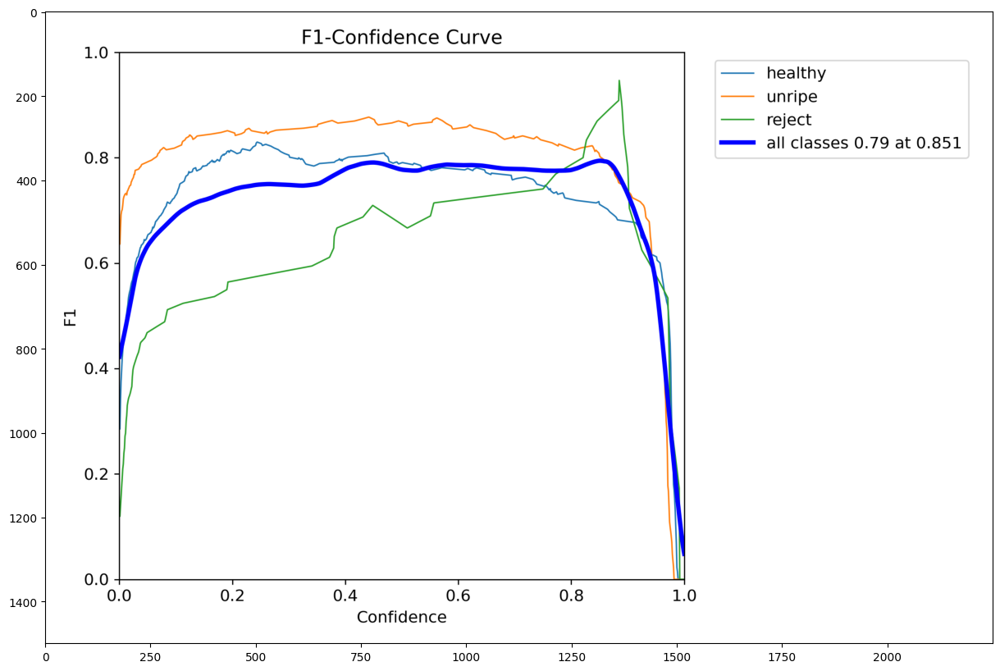

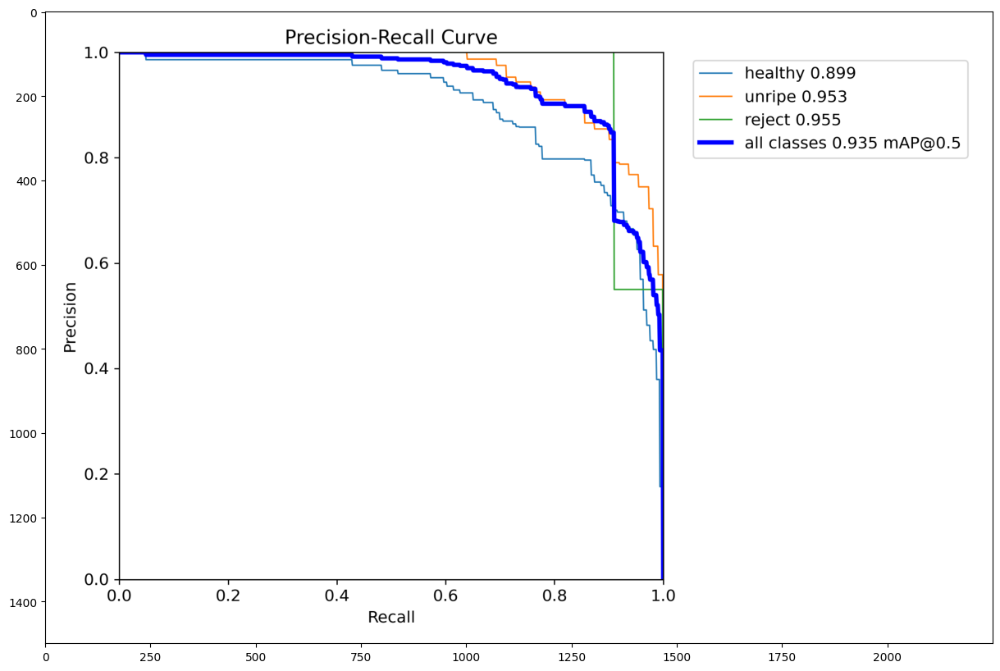

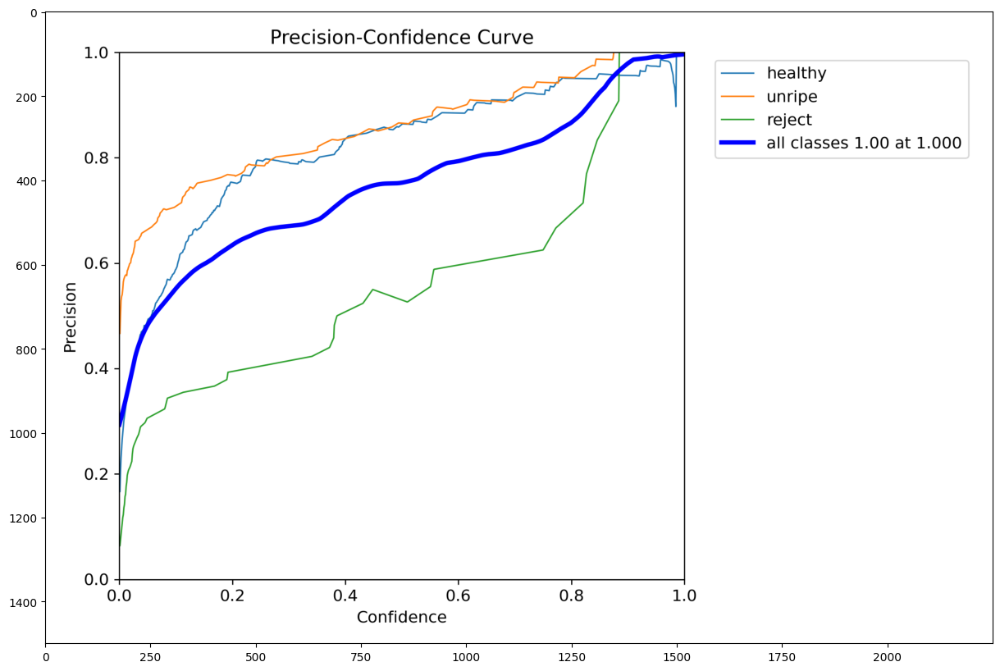

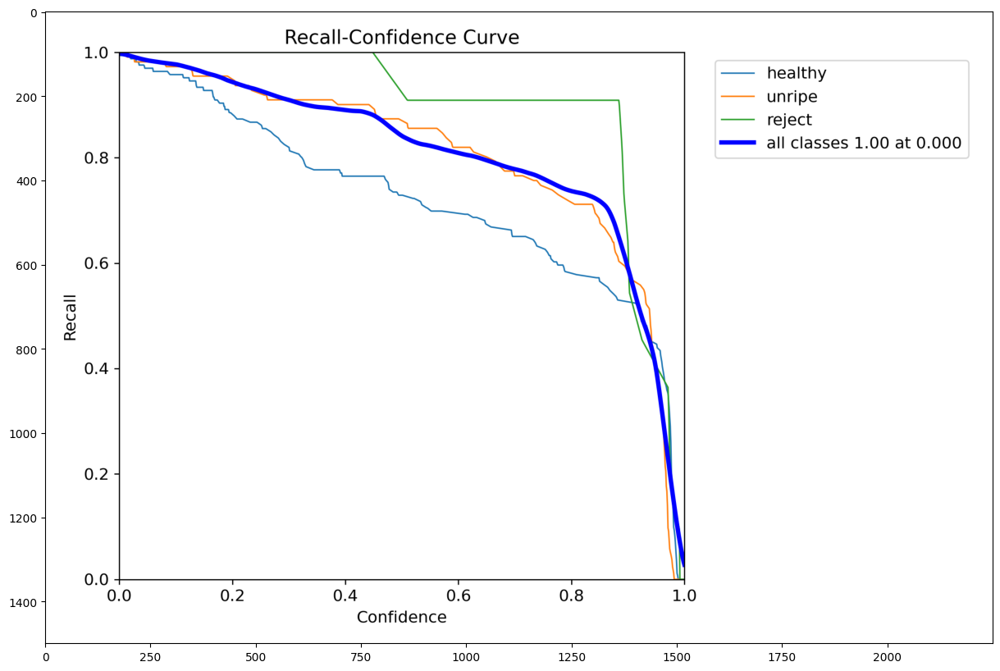

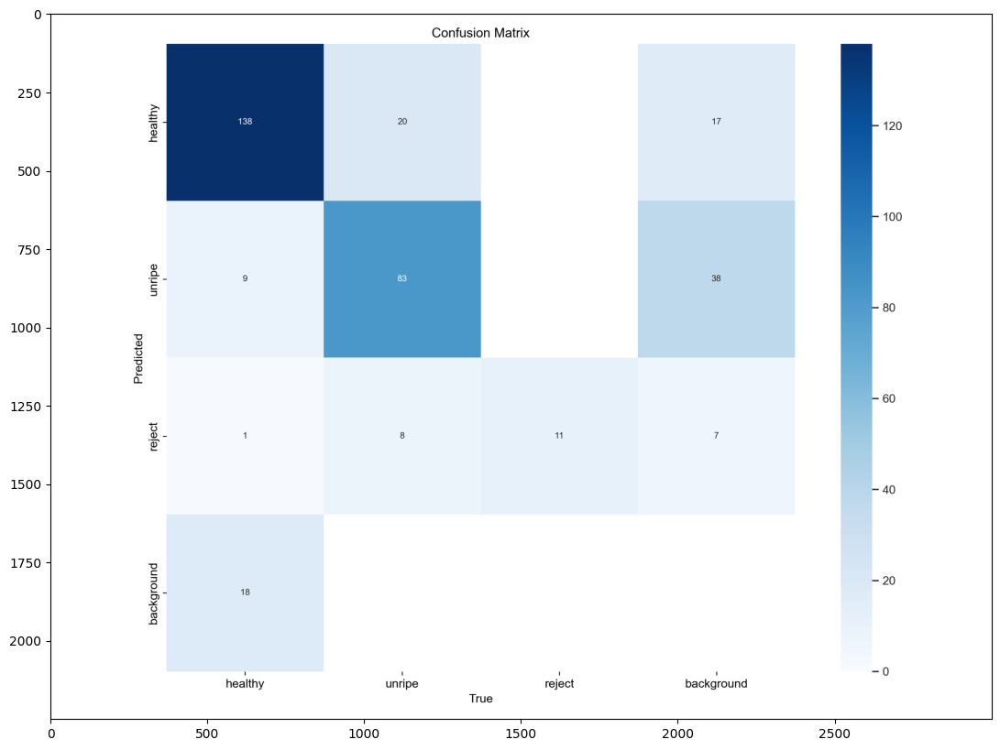

...

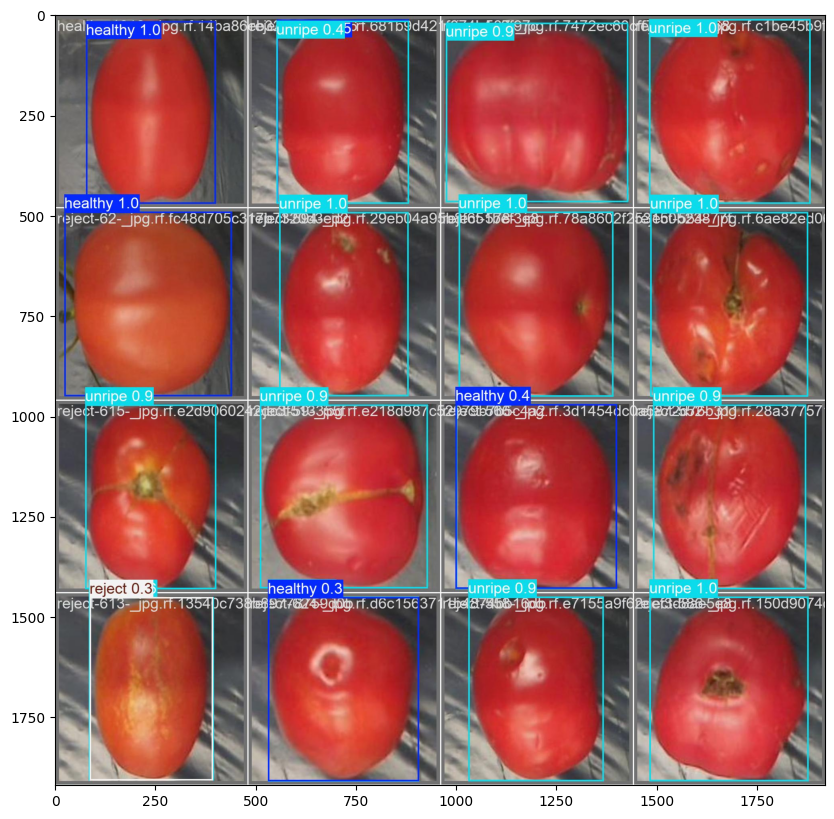

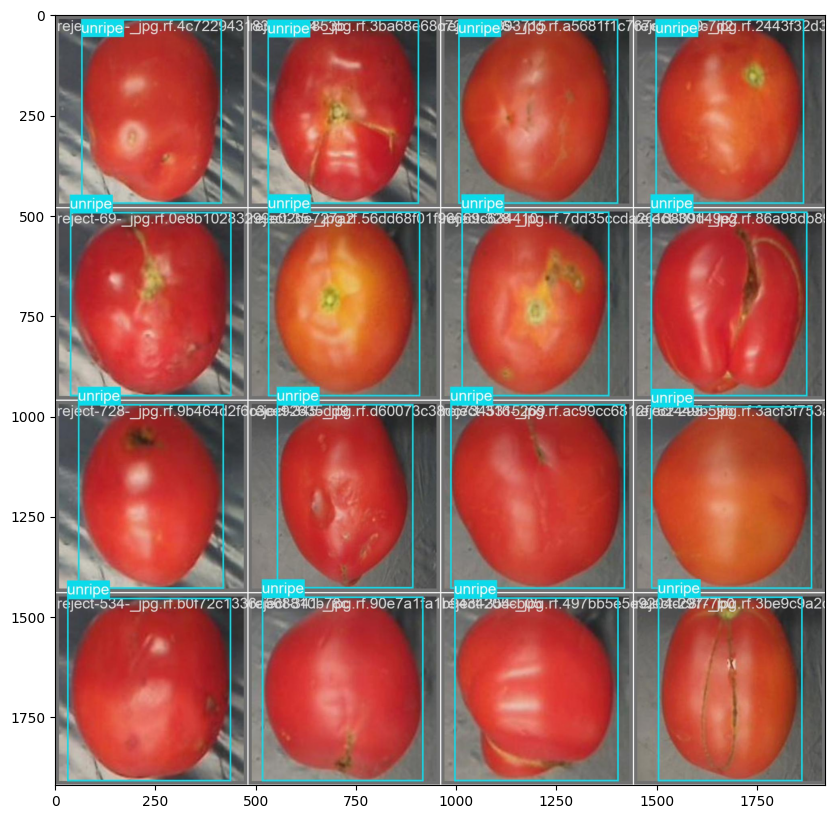

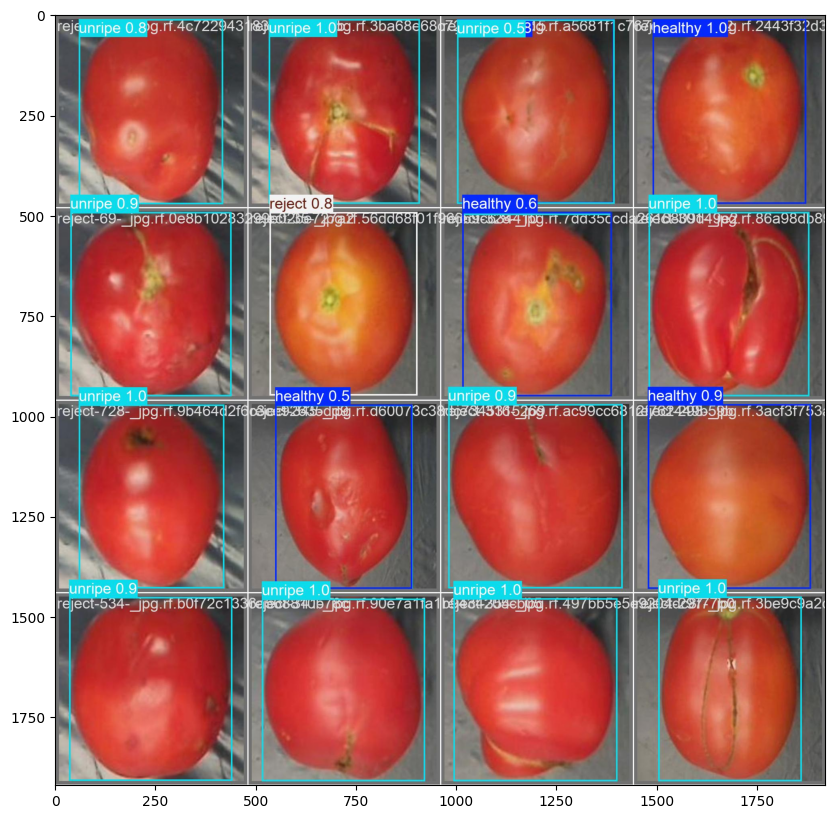

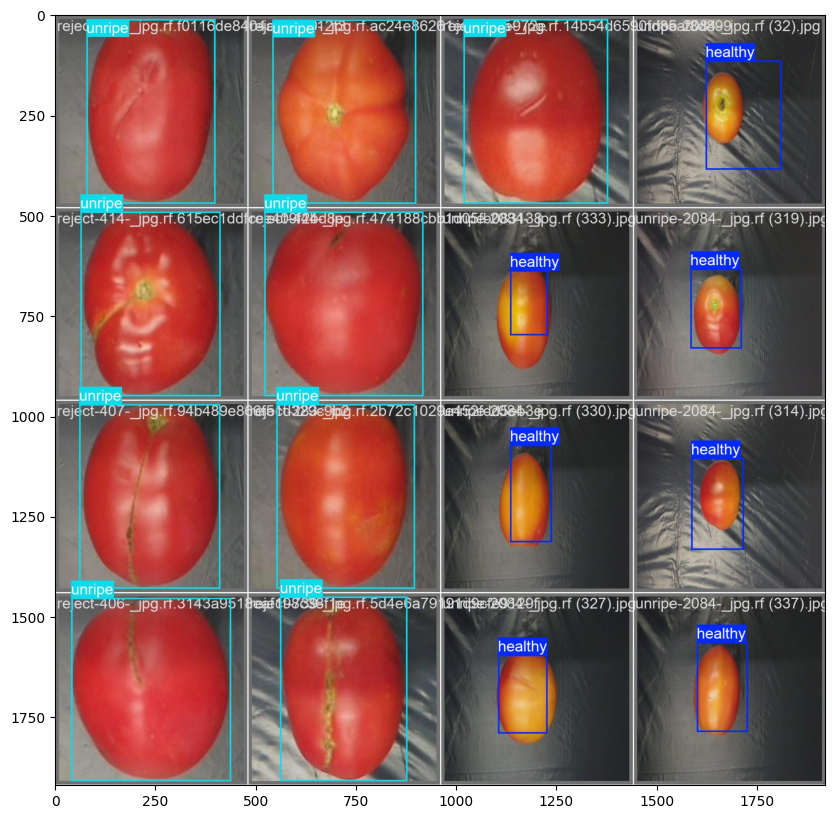

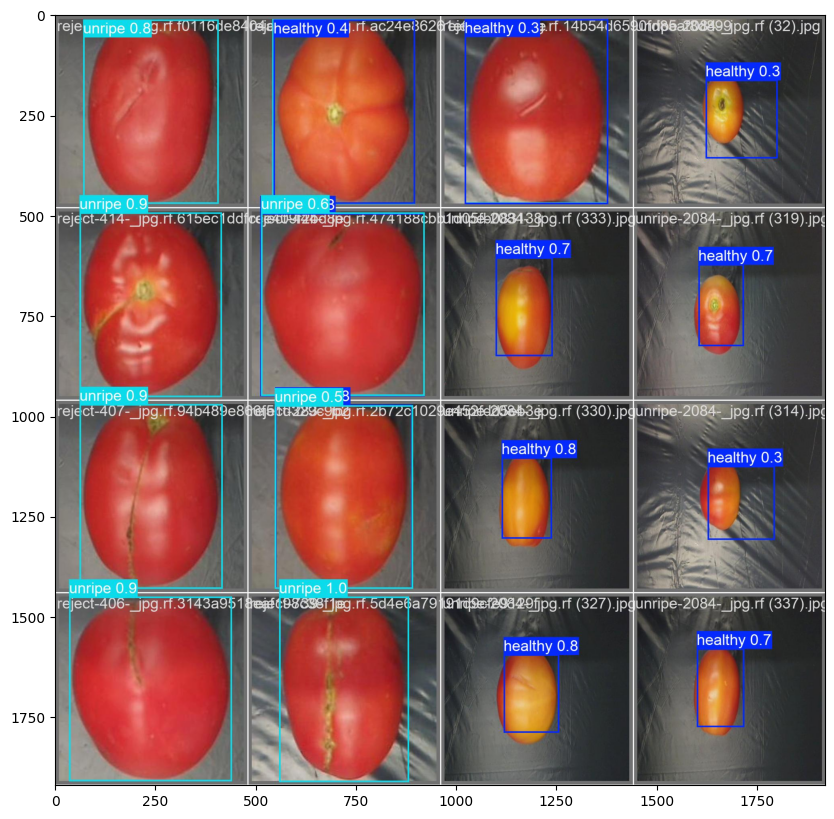

In [25]:
for path in tpaths2:
    image = Image.open(path)
    image=np.array(image)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show()


In [26]:
# evaluate model performance on the validation set
results = model.val()

Ultralytics 8.3.3  Python-3.12.4 torch-2.4.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
Model summary (fused): 186 layers, 2,684,953 parameters, 0 gradients, 6.8 GFLOPs


val: Scanning C:\Users\alenk\OneDrive\Documents\tomato\dataset_2\images\test\labels.cache... 288 images, 0 backgrounds, 0 corrupt: 100%|██████████| 288/288 [00:00<?, ?it/s]

WARNING  Box and segment counts should be equal, but got len(segments) = 5, len(boxes) = 288. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.48it/s]


                   all        288        288      0.912      0.728      0.935      0.879
               healthy        166        166       0.95      0.573      0.899      0.801
                unripe        111        111      0.975      0.702      0.953      0.938
                reject         11         11      0.811      0.909      0.955      0.898
Speed: 0.8ms preprocess, 8.2ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to runs\detect\train32


## 5. Testing

Let's test our model with test images.


image 1/1 c:\Users\alenk\OneDrive\Documents\tomato\dataset_2\images\test\images\unripe-2084-_jpg.rf (2).jpg: 736x736 1 healthy, 68.8ms
Speed: 27.2ms preprocess, 68.8ms inference, 16.4ms postprocess per image at shape (1, 3, 736, 736)


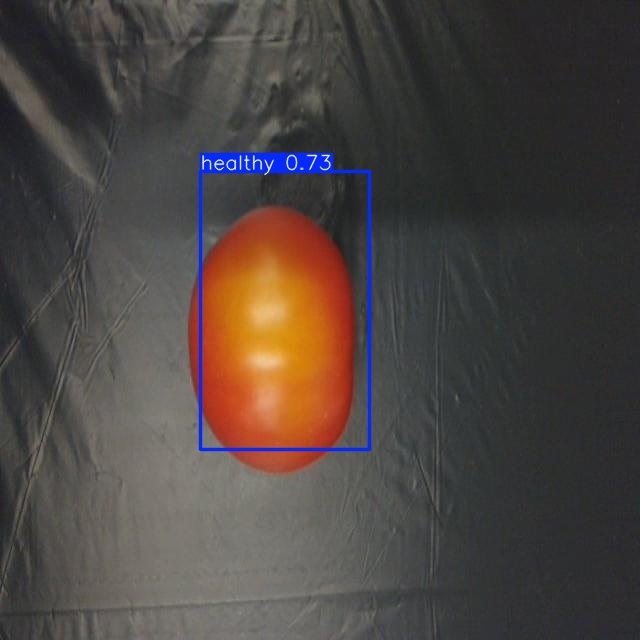


image 1/1 c:\Users\alenk\OneDrive\Documents\tomato\dataset_2\images\test\images\reject-785-_jpg.rf.301004b04930311cb89cc930fef5e9a8.jpg: 736x736 1 healthy, 75.9ms
Speed: 7.3ms preprocess, 75.9ms inference, 22.1ms postprocess per image at shape (1, 3, 736, 736)


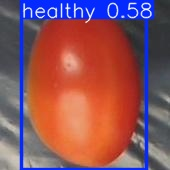


image 1/1 c:\Users\alenk\OneDrive\Documents\tomato\dataset_2\images\test\images\unripe-2084-_jpg.rf (330).jpg: 736x736 1 healthy, 43.6ms
Speed: 12.6ms preprocess, 43.6ms inference, 13.7ms postprocess per image at shape (1, 3, 736, 736)


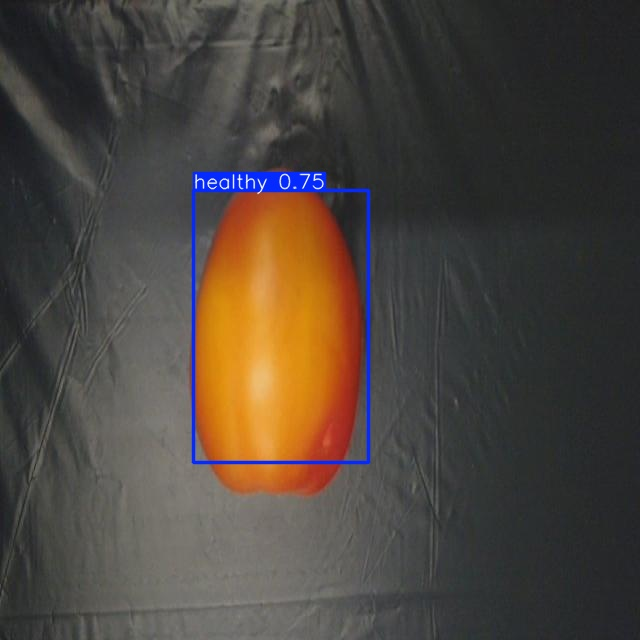


image 1/1 c:\Users\alenk\OneDrive\Documents\tomato\dataset_2\images\test\images\reject-186-_jpg.rf.b74727bd82e2762833f6cc5ff931c89a.jpg: 736x736 1 unripe, 48.8ms
Speed: 8.5ms preprocess, 48.8ms inference, 18.0ms postprocess per image at shape (1, 3, 736, 736)


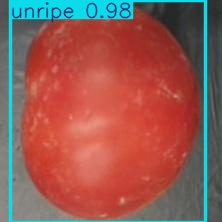


image 1/1 c:\Users\alenk\OneDrive\Documents\tomato\dataset_2\images\test\images\healthy-1461-_jpg.rf.92a672f2232d40d40e12bd2f23c8d40b.jpg: 736x736 1 healthy, 39.8ms
Speed: 8.3ms preprocess, 39.8ms inference, 11.8ms postprocess per image at shape (1, 3, 736, 736)


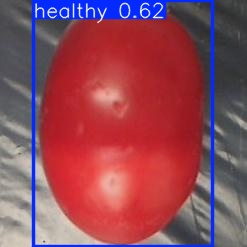


image 1/1 c:\Users\alenk\OneDrive\Documents\tomato\dataset_2\images\test\images\unripe-303-_jpg.rf.ac691937058b06730ea4af14e5a727ac.jpg: 736x736 1 reject, 56.1ms
Speed: 11.8ms preprocess, 56.1ms inference, 8.4ms postprocess per image at shape (1, 3, 736, 736)


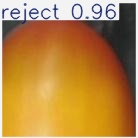


image 1/1 c:\Users\alenk\OneDrive\Documents\tomato\dataset_2\images\test\images\healthy-1146-_jpg.rf.068442fe0e049640e6b5f484ad9a9b47.jpg: 736x736 1 healthy, 36.7ms
Speed: 8.3ms preprocess, 36.7ms inference, 10.7ms postprocess per image at shape (1, 3, 736, 736)


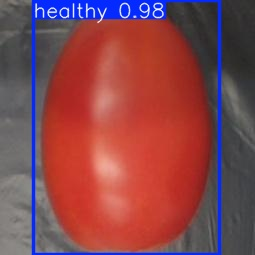


image 1/1 c:\Users\alenk\OneDrive\Documents\tomato\dataset_2\images\test\images\healthy-1573-_jpg.rf.7b02fccb7fab5a3315985a9c609a0ade.jpg: 736x736 1 healthy, 79.1ms
Speed: 8.9ms preprocess, 79.1ms inference, 10.4ms postprocess per image at shape (1, 3, 736, 736)


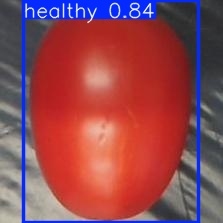


image 1/1 c:\Users\alenk\OneDrive\Documents\tomato\dataset_2\images\test\images\reject-68-_jpg.rf.c18afdbce90db42e66aef2be2c5433ba.jpg: 736x736 1 reject, 44.3ms
Speed: 10.3ms preprocess, 44.3ms inference, 8.6ms postprocess per image at shape (1, 3, 736, 736)


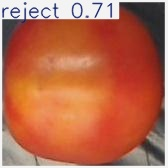


image 1/1 c:\Users\alenk\OneDrive\Documents\tomato\dataset_2\images\test\images\healthy-1013-_jpg.rf.14ba86eb32432792b1629969210d8f8b.jpg: 736x736 1 healthy, 52.4ms
Speed: 8.2ms preprocess, 52.4ms inference, 3.3ms postprocess per image at shape (1, 3, 736, 736)


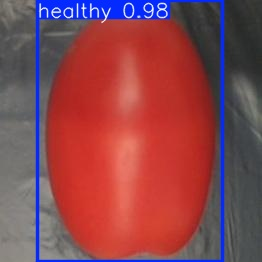

In [30]:
# Define the path to the images
images_path = r'dataset_2/images/test/images'
num_images = 10

# Sample a subset of images
images = random.sample([f for f in os.listdir(images_path) if f.endswith('.jpg')], num_images)

# Show the results on test images
for image in images:
    img_path = os.path.join(images_path, image)
    results = model(img_path, conf=0.5, iou=0.6)
    r = results[0]
    im_array = r.plot()  # plot a BGR numpy array of predictions

    # Save the image with predictions
    save_path = f'dataset_2\\test_1{image}'
    cv2.imwrite(save_path, im_array)

    # Display the image
    display(Image.open(save_path))

## 7. Conclusion

In this way, we can use YOLO to detect ripe, unripe and damaged tomatoes.